# Задание на графы

> Долог путь до Типперэри... ([старая песня](https://ru.wikipedia.org/wiki/%D0%9F%D1%83%D1%82%D1%8C_%D0%B4%D0%B0%D0%BB%D1%91%D0%BA%D0%B8%D0%B9_%D0%B4%D0%BE_%D0%A2%D0%B8%D0%BF%D0%BF%D0%B5%D1%80%D0%B5%D1%80%D0%B8))

> (песня не про этот Типперэри:)
>
> ![](https://upload.wikimedia.org/wikipedia/commons/thumb/9/90/The_Tipperary%2C_London%2C_January_2018_07.jpg/180px-The_Tipperary%2C_London%2C_January_2018_07.jpg)

В задании вам нужно будет реализовать несколько алгоритмов поиска кратчайшего пути и сравнить их работу. Для этого потребуется понять, как работать с очередью с приоритетами, а также изучить основы использования библиотеки networkx для работы с графами.

In [5]:
# Импорт библиотек

# Библиотека networkx (networkx.org) - библиотека для работы с графами
# Потребуется только для хранения графа
import networkx as nx

import pandas as pd
import heapq
import math
import random

# Будем рисовать анимации в Jupyter для понимания процесса работы алгоритма
import matplotlib.animation
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import HTML

# Импорт и подготовка данных

В этой работе вам нужно будет искать ~барный тур~ кратчайший путь между различными заведениями.

Данные взяты из *пуб*лично доступного набора данных: [Geocoded Pubs in England with Food Hygiene Ratings
Establishments and their Location Information](https://www.kaggle.com/datasets/thedevastator/geocoded-pubs-in-england-with-food-hygiene-ratin) by [GetTheData](https://data.world/getthedata). Далее заранее извлечены данные о тех заведениях, которые находятся в Лондоне.

Необходимые вам данные можно найти [здесь](https://paste.sr.ht/~rd/dc4d094eb65cdf3d07920ffec35e643059b5b5a0).

In [6]:
# Получим данные по ссылке, указанной выше
df = pd.read_csv("https://paste.sr.ht/blob/8ce2a2a7668a09cd852bc59f3987ef126ffe4bc3")

# Соберём вершины графа
pub_dict = df.to_dict('index')
g = nx.Graph()
g.add_nodes_from(pub_dict)

# Создадим словарь с широтой и долготой вершин графа
pos_dict = { k: (v['lon'], v['lat']) for k,v in pub_dict.items() }

# Сколько всего вершин
len(g.nodes())

92

## Рёбра и их вес

В исходных данных у нас нет рёбер графа. Мы построим их самостоятельно.

Будем считать, что две вершины соединены ребром, если расстояние между ними меньше 0.02° (поскольку все вершины находятся в Лондоне, мы пренебрегаем кривизной Земли и считаем просто евклидово расстояние между точками с заданной широтой и долготой).

Кроме того, если нет вершин ближе 0.02°, добавим ребро до ближайшей вершины.

Длиной ребра (весом) будем считать расстояние между вершинами в градусах.

In [7]:
# Функция dist считает расстояние в градусах
# между вершинами с индексами idx1 и idx2
def dist(idx1: int, idx2: int) -> float:
  (p1x,p1y) = pos_dict.get(idx1)
  (p2x,p2y) = pos_dict.get(idx2)
  dx = p2x - p1x
  dy = p2y - p1y
  return math.sqrt(dx*dx + dy*dy)

In [8]:
# Сколько градусов можем пройти
WALK_DIST = 0.02

# Добавляем в граф наши рёбра
g.clear_edges()
for k, v in pub_dict.items():
  edges = set()
  min_edge = None
  for k2, v2 in pub_dict.items():
    if k != k2 and dist(k, k2) < WALK_DIST:
      edges.add((k, k2, dist(k, k2)))
    if k != k2 and (min_edge is None or min_edge[2] > dist(k, k2)):
      min_edge = (k, k2, dist(k, k2))
  if len(edges) == 0:
    edges.add(min_edge)
  g.add_weighted_edges_from(edges)

# Сколько всего получилось рёбер
len(g.edges())

873

# Анимации

Для удобства были подготовлены несколько функций, которые можно использовать для анимирования состояния, в котором находится алгоритм. Пример использования этих функций у вас будет, но вы можете прочитать и более детальное описание ниже.

## Инициализация
Функцию `init_animation(g, pos)` нужно вызвать _до_ начала работы.

Ей передаётся граф `g` (объект класса `nx.Graph`) и положения вершин графа (словарь из идентификаторов вершин в пары `(x,y)`).

Положения вершин можно сгенерировать из исходных данных функцией `nx.spring_layout(g)` (в этом методе рёбра графа считаются пружинками, а сам он располагается так, чтобы они были меньше всего нагружены; в результате граф обычно располагается красиво) или приготовить самостоятельно.

Сохраните возвращаемое значение для дальнейшей работы

## Сохранение состояния
Функция `save_state(an, title, visited, seen)` сохраняет один кадр анимации, где `an` --- значение, возвращённое из `init_animation`. Вызывайте её один раз во внешнем цикле

Кадр будет озаглавлен `title`, на нём будет изображён граф, в котором вершины из списка `visited` будут окрашены чёрным, из списка `seen` — серым, а остальные вершины — белым.

Это позволит понимать, как происходит работа алгоритма.

## Рисование анимации
Функция `draw_animation(an)` выполняет собственно рисование. Вызовите её после окончания работы вашего алгоритма.

In [9]:
def init_animation(g, pos):
  fig, ax = plt.subplots()
  return {'graph': g, 'pos': pos, 'fig': fig, 'ax': ax, 'frames': []}

def save_frame(an, title, visited, seen):
  an.get('frames').append({'title': title, 'visited': visited.copy(), 'seen': seen.copy()})

def draw_animation(an):
  G = an.get('graph')
  ax = an.get('ax')
  fig = an.get('fig')
  pos = an.get('pos')
  frames = an.get('frames')

  def update(num):
    ax.clear()

    frame = frames[num]
    title = frame.get('title')
    visited = frame.get('visited')
    seen = frame.get('seen')

    # Background nodes
    nx.draw_networkx_edges(G, pos=pos, ax=ax, edge_color="gray")
    null_nodes = nx.draw_networkx_nodes(G, pos=pos, nodelist=set(G.nodes()) - set(visited) - set(seen), node_color="white",  ax=ax)
    null_nodes.set_edgecolor("black")

    # Visited nodes
    vis_nodes = nx.draw_networkx_nodes(G, pos=pos, nodelist=set(visited), node_color="black",  ax=ax)
    vis_nodes.set_edgecolor("black")

    # Seen nodes
    seen_nodes = nx.draw_networkx_nodes(G, pos=pos, nodelist=set(seen), node_color="gray", ax=ax)
    seen_nodes.set_edgecolor("white")
    # nx.draw_networkx_labels(G, pos=pos, labels=dict(zip(path,path)),  font_color="white", ax=ax)
    # edgelist = [path[k:k+2] for k in range(len(path) - 1)]
    # nx.draw_networkx_edges(G, pos=pos, edgelist=edgelist, width=idx_weights[:len(path)], ax=ax)

    # Scale plot ax
    ax.set_title("Frame %d:    "%(num+1) + " - " + title, fontweight="bold")
    ax.set_xticks([])
    ax.set_yticks([])

  ani = matplotlib.animation.FuncAnimation(fig, update, frames=len(frames), interval=1000, repeat=True)
  return HTML(ani.to_jshtml())

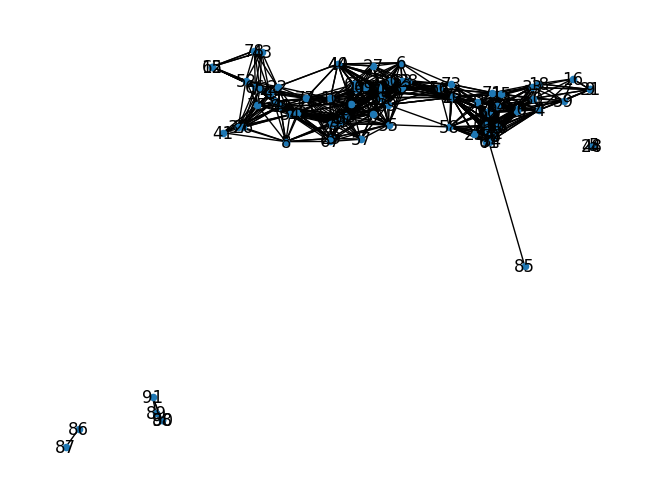

In [10]:
# Просто нарисуем граф со всеми вершинами и их номерами
node_labels_dict = { k: k for k, _v in pub_dict.items() }
nx.draw(g, pos=pos_dict, labels=node_labels_dict, node_size=20)
# Можем использовать spring_layout, чтобы видеть лучше (правда, это не поможет)
#     nx.draw(g, pos=nx.spring_layout(g), labels=node_labels_dict, node_size=20)

# Откуда и куда

Наш путь начинается в вершине `FROM`, а идём мы в сторону вершины `TO`.

Эти вершины выбраны так, чтобы они были достаточно далеко друг от друга на картинке: вершина 41 находится в левой нижней части "облака" точек, а из вершины 85 идёт единственное ребро в правую часть "облака".

In [11]:
FROM = 41
# also can try: 48
TO = 85

# Работа с графами в networkx

- Чтобы итерироваться по вершинам, используйте метод `g.nodes()` или просто `for node in g`.
- Свойства вершины можно получить, используя `g[v]`, где `v` — вершина.
- Чтобы пройтись по **всем** рёбрам, используйте метод `g.edges()`.
- Чтобы получить свойства конкретного ребра из вершины `u` в `v`, используйте `g.edges[u, v]`. Например, вес ребра можно получить так: `g.edges[u, v]['weight']`.
- Чтобы пройтись по всем соседним вершинам заданной вершины `v`, используйте `g.neighbors(v)`: например, `for neighbor in g.neighbors(v)`.

## Пример работы с графом и анимацией

Нарисуем анимацию того, как работает поиск в ширину, заодно попробуем часть функций работы с графом из описания выше

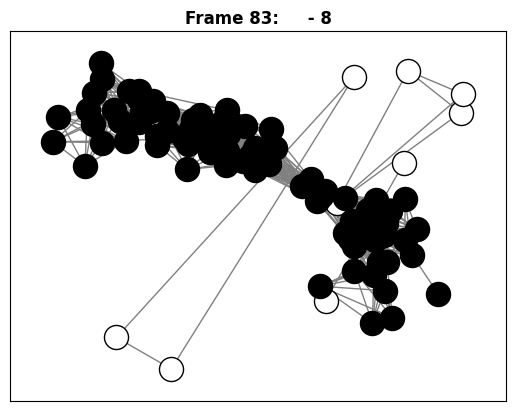

In [12]:
# Инициализируем анимацию. Если хотите реальные положения вершин, поменяйте на
#     an = init_animation(g, pos_dict)
an = init_animation(g, nx.spring_layout(g))

# Функция выполняет BFS из вершины start
def bfs(g, start):
  visited = {}
  visited[start] = True

  queue = [start]
  while queue:
    cur = queue.pop()

    # сохраняем кадр анимации
    save_frame(an, str(cur), visited, queue)

    # проходимся по соседям вершины cur
    for neighbour in g.neighbors(cur):
      if not visited.get(neighbour, False):
        visited[neighbour] = True
        queue.append(neighbour)

# Запустим BFS из исходной вершины
bfs(g, FROM)

# Нарисуем, что получилось
draw_animation(an)

## Вопросы на самопроверку

- какая вершина будет покрашена в чёрный последней?
- влияют ли географические координаты на порядок, в котором мы посещаем вершины?
- почему часть вершин остаётся белыми?

# Алгоритм Дейкстры

Чтобы учесть расстояния, одного BFS недостаточно. Будем использовать алгоритм Дейкстры. Он, конечно, есть библиотечный, но вам потребуется написать свою реализацию, она вам пригодится.

## Очередь с приоритетами

В алгоритме Дейкстры требуется менять приоритет вершины в очереди (когда вы нашли более короткий путь до какой-то вершины, а её соседа вы уже видели).

В оригинальном алгоритме использовалась операция `UpdateKey`. Но для её реализации нужно применять более сложные структуры данных. Мы воспользуемся более простым решением: будем добавлять вершину с новым приоритетом в очередь, а когда при вытаскивании из очереди мы встретим вершину, которую уже встречали, просто её пропустим.

## Вопросы для самопроверки

- почему в алгоритме Дейкстры допустимо такое решение?
- как при этом меняется время работы алгоритма Дейкстры?

# Задание (1 балл)

Реализовать алгоритм Дейкстры как описано выше

0.13137858574698386


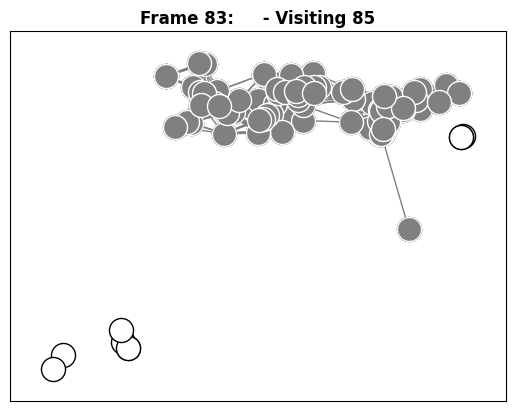

In [31]:
an = init_animation(g, pos_dict)

def dijkstra_with_animation(g, start):
    distances = {node: float('inf') for node in g}
    distances[start] = 0
    priority_queue = [(0, start)]
    visited = set()

    while priority_queue:
        current_distance, current_node = heapq.heappop(priority_queue)

        if current_node in visited:
            continue

        visited.add(current_node)
        save_frame(an, f"Visiting {current_node}", list(visited), [n for n, d in distances.items() if d != float('inf')])

        for neighbor in g.neighbors(current_node):
            distance = g.edges[current_node, neighbor]['weight']
            new_distance = current_distance + distance

            if new_distance < distances[neighbor]:
                distances[neighbor] = new_distance
                heapq.heappush(priority_queue, (new_distance, neighbor))

    return distances

dijkstra_with_animation(g, FROM)
print(distances[TO])
draw_animation(an)

## Вопросы для самопроверки

- рассмотрите анимацию. На каком шаге алгоритм закрашивает вершину `TO`?
- используем ли мы географические координаты для поиска пути?

# Алгоритм поиска пути A*

В некоторых случаях мы можем использовать какие-то наши догадки для более эффективного поиска пути. Например, если вы едете из Казани в Мамадыш, и у вас есть выбор между поездкой в Париж и Зеленодольск, логичнее вначале поискать путь через Зеленодольск, ведь он на карте ближе.

В нашей задаче тоже есть координаты, давайте их использовать для поиска!

В [алгоритме A*](https://en.wikipedia.org/wiki/A*_search_algorithm) в дополнение к длине найденного пути $g(v)$ используется эвристика — функция $h(v)$, которая возвращает оценку, насколько далеко от вершины $v$ до цели. На каждом шаге выбирается вершина $v$ с наименьшей величиной $f(v) = g(v) + h(v)$.

Алгоритм Дейкстры можно считать частным случаем, когда для всех вершин $h(v) = 0$.

Если эвристика верная и никогда не преувеличивает реальную длину пути (т.е. $h(v) \le g(v)$ для всех вершин $v$), то алгоритм A* найдёт путь минимальной длины.

# Задание (2 балла)

- Используйте в качестве эвристики расстояние от указанной вершины до цели `TO`.
- Реализуйте алгоритм A* и анимацию его работы.

In [30]:
def evristika(node, goal):
    (x1, y1) = pos_dict[node]
    (x2, y2) = pos_dict[goal]
    return math.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)

def a_with_animation(g, start, goal):
    distances = {node: float('inf') for node in g}
    distances[start] = 0
    priority_queue = [(evristika(start, goal), start)]
    visited = set()

    while priority_queue:
        _, current_node = heapq.heappop(priority_queue)

        if current_node in visited:
            continue

        visited.add(current_node)
        save_frame(an, f"Visiting {current_node}", list(visited), [n for n, d in distances.items() if d != float('inf')])

        if current_node == goal:
            break

        for neighbor in g.neighbors(current_node):
            distance = g.edges[current_node, neighbor]['weight']
            new_distance = distances[current_node] + distance

            if new_distance < distances[neighbor]:
                distances[neighbor] = new_distance
                priority = new_distance + evristika(neighbor, goal)
                heapq.heappush(priority_queue, (priority, neighbor))

    return distances

a_with_animation(g, FROM, TO)

draw_animation(an)


## Вопросы для самопроверки

- используются ли географические координаты для поиска пути в A*?
- является ли использованная эвристика корректной?
- есть ли вершины, для которых длина реального пути больше, чем эвристика?
- на каком шаге алгоритм A* закрасил вершину `TO`?
- нашёл ли A* кратчайший путь быстрее алгоритма Дейкстры?
- ... быстрее поиска в ширину?
- почему?